In [14]:
pip install yfinance


Loading stock details Inorder to compare S&P Stock values with its respective sectors

In [15]:
import yfinance as yf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date, timedelta

In [68]:
#Loading Stock Market Data

symbols = ['^SPX', 'MSFT', 'GOOGL', 'META', 'AMZN',
           'TSLA','AAPL','NVDA','GOOG','LLY',
           'AVGO','JPM','V','XOM','AVGO',
           'UNH','MA','PG','JNJ', 'HD',
           'MRK','COST','ABBV','CRM','NFLX',
           'BAC','WMT','PEP','KO','LIN','TMO']

start_date = date.today() - timedelta(days=700)  # Calculate start date
end_date = date.today()  # End date is today
df_stock_data_all = pd.DataFrame()
for symbol in symbols:
    df_stock_data = yf.download(tickers=symbol, start=start_date, end=end_date, interval='60m')
    df_stock_data['Symbol'] = symbol
    df_stock_data_all=pd.concat([df_stock_data,df_stock_data_all])

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [69]:
#Loading Stock Market Data

symbols = ['^SPX', 'MSFT', 'GOOGL', 'META', 'AMZN',
           'TSLA','AAPL','NVDA','GOOG','LLY',
           'AVGO','JPM','V','XOM','AVGO',
           'UNH','MA','PG','JNJ', 'HD',
           'MRK','COST','ABBV','CRM','NFLX',
           'BAC','WMT','PEP','KO','LIN','TMO']

start_date = date.today() - timedelta(days=5000)  # Calculate start date
end_date = date.today() - timedelta(days=700)

for symbol in symbols:
    df_stock_data1 = yf.download(tickers=symbol, start=start_date, end=end_date)
    df_stock_data1['Symbol'] = symbol
    df_stock_data_all=pd.concat([df_stock_data1,df_stock_data_all])

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [70]:
df_stock_data_all.index.name = 'Datetime'


In [72]:
##checking live data
from datetime import datetime, timedelta

today_date= datetime.today().date
previous_date = datetime.today().date() - timedelta(days=1)
df=df_stock_data_all[df_stock_data_all.index.date == previous_date]
df[df['Symbol']=='AMZN']

,Open,High,Low,Close,Adj Close,Volume,Symbol
Datetime,,,,,,,
2024-04-09 09:30:00,187.250000,187.339996,185.229996,186.020096,186.020096,8670958,AMZN
2024-04-09 10:30:00,186.039993,186.134399,184.910004,185.020004,185.020004,5463662,AMZN
2024-04-09 11:30:00,185.021393,185.826706,184.889999,185.444901,185.444901,2916307,AMZN
2024-04-09 12:30:00,185.449997,185.720001,184.910004,185.020004,185.020004,2842575,AMZN
2024-04-09 13:30:00,185.009995,185.119904,184.354996,184.770004,184.770004,3051522,AMZN
2024-04-09 14:30:00,184.779999,185.460007,184.205002,185.425003,185.425003,3246925,AMZN
2024-04-09 15:30:00,185.425003,185.770004,185.020004,185.710007,185.710007,3776849,AMZN


In [19]:
# Pivot the DataFrame
df_stock_data_pt = df_stock_data_all.pivot_table(index='Datetime', columns='Symbol', values=['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'])

df_stock_data_pt.columns = ['_'.join(col).strip() for col in df_stock_data_pt.columns.values]

# Reset index to make Date a column again
df_stock_data_pt.reset_index(inplace=True)

df_stock_data_pt

,Datetime,Adj Close_AAPL,Adj Close_ABBV,Adj Close_AMZN,Adj Close_AVGO,Adj Close_BAC,Adj Close_COST,Adj Close_CRM,Adj Close_GOOG,Adj Close_GOOGL,...,Volume_NVDA,Volume_PEP,Volume_PG,Volume_TMO,Volume_TSLA,Volume_UNH,Volume_V,Volume_WMT,Volume_XOM,Volume_^SPX
0,2010-08-02 00:00:00,7.917219,NaN,6.003500,15.659073,11.683148,40.990925,25.444263,12.214467,12.272523,...,91702000.0,6479700.0,11167800.0,9136600.0,10771500.0,7440900.0,53846800.0,41583000.0,28144000.0,4.144180e+09
1,2010-08-03 00:00:00,7.919633,NaN,6.121000,15.494084,11.602239,40.781807,25.219557,12.200021,12.258008,...,95544400.0,5577200.0,24449800.0,8399000.0,18457500.0,9954200.0,34164800.0,32005800.0,31075800.0,4.071820e+09
2,2010-08-04 00:00:00,7.951384,NaN,6.379000,16.024904,11.480873,41.545391,25.856224,12.610732,12.670671,...,85549600.0,6663800.0,19654100.0,6017900.0,13695000.0,9379500.0,20499200.0,24206700.0,21033800.0,4.057850e+09
3,2010-08-05 00:00:00,7.912682,NaN,6.391500,16.311832,11.343334,40.865040,25.639009,12.655066,12.715215,...,80050400.0,5143100.0,12620400.0,4336400.0,11943000.0,7829600.0,30787600.0,22317000.0,19985300.0,3.685560e+09
4,2010-08-06 00:00:00,7.864002,NaN,6.416000,16.204231,11.294789,40.922939,25.549126,12.458801,12.518018,...,73990400.0,5500700.0,12649700.0,3562500.0,11128500.0,7479400.0,19362800.0,24810900.0,23097300.0,3.857890e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6310,2024-04-09 11:30:00,169.070007,168.940002,185.444901,1324.560059,37.509998,712.710022,302.079987,158.270004,156.770004,...,6782422.0,198723.0,310558.0,66120.0,10152558.0,364083.0,352047.0,740543.0,1440595.0,4.431046e+08
6311,2024-04-09 12:30:00,169.259995,169.189896,185.020004,1325.140015,37.529999,713.945007,301.910004,158.059998,156.565002,...,3996878.0,278358.0,517738.0,66006.0,7607076.0,310230.0,281010.0,848687.0,950763.0,3.359197e+08
6312,2024-04-09 13:30:00,168.585007,169.000000,184.770004,1332.359985,37.529999,713.609985,300.339996,157.410004,155.910004,...,3527084.0,218170.0,323402.0,105097.0,8713931.0,304948.0,243869.0,801399.0,995466.0,3.170229e+08
6313,2024-04-09 14:30:00,169.252502,169.639999,185.425003,1334.170654,37.735001,717.250000,301.850006,157.740005,156.250000,...,4249604.0,337511.0,345396.0,126070.0,6993827.0,349689.0,299253.0,1232317.0,1278555.0,3.730560e+08


In [20]:
df_stock_data_pt.columns

Index(['Datetime', 'Adj Close_AAPL', 'Adj Close_ABBV', 'Adj Close_AMZN',
       'Adj Close_AVGO', 'Adj Close_BAC', 'Adj Close_COST', 'Adj Close_CRM',
       'Adj Close_GOOG', 'Adj Close_GOOGL',
       ...
       'Volume_NVDA', 'Volume_PEP', 'Volume_PG', 'Volume_TMO', 'Volume_TSLA',
       'Volume_UNH', 'Volume_V', 'Volume_WMT', 'Volume_XOM', 'Volume_^SPX'],
      dtype='object', length=181)

**Data Preprocessing**

In [23]:
df_stock_data_pt.head(5)

,Datetime,Adj Close_AAPL,Adj Close_ABBV,Adj Close_AMZN,Adj Close_AVGO,Adj Close_BAC,Adj Close_COST,Adj Close_CRM,Adj Close_GOOG,Adj Close_GOOGL,...,Volume_NVDA,Volume_PEP,Volume_PG,Volume_TMO,Volume_TSLA,Volume_UNH,Volume_V,Volume_WMT,Volume_XOM,Volume_^SPX
0,2010-08-02,7.917219,NaN,6.0035,15.659073,11.683148,40.990925,25.444263,12.214467,12.272523,...,91702000.0,6479700.0,11167800.0,9136600.0,10771500.0,7440900.0,53846800.0,41583000.0,28144000.0,4.144180e+09
1,2010-08-03,7.919633,NaN,6.1210,15.494084,11.602239,40.781807,25.219557,12.200021,12.258008,...,95544400.0,5577200.0,24449800.0,8399000.0,18457500.0,9954200.0,34164800.0,32005800.0,31075800.0,4.071820e+09
2,2010-08-04,7.951384,NaN,6.3790,16.024904,11.480873,41.545391,25.856224,12.610732,12.670671,...,85549600.0,6663800.0,19654100.0,6017900.0,13695000.0,9379500.0,20499200.0,24206700.0,21033800.0,4.057850e+09
3,2010-08-05,7.912682,NaN,6.3915,16.311832,11.343334,40.865040,25.639009,12.655066,12.715215,...,80050400.0,5143100.0,12620400.0,4336400.0,11943000.0,7829600.0,30787600.0,22317000.0,19985300.0,3.685560e+09
4,2010-08-06,7.864002,NaN,6.4160,16.204231,11.294789,40.922939,25.549126,12.458801,12.518018,...,73990400.0,5500700.0,12649700.0,3562500.0,11128500.0,7479400.0,19362800.0,24810900.0,23097300.0,3.857890e+09


In [24]:
df_stock_data_pt.describe().T


,count,mean,min,25%,50%,75%,max,std
Datetime,6315,2020-02-06 12:21:06.128265984,2010-08-02 00:00:00,2016-11-05 12:00:00,2022-06-21 12:30:00,2023-05-15 13:00:00,2024-04-09 15:30:00,NaN
Adj Close_AAPL,6313.0,109.218772,7.254451,28.575014,141.059998,170.860001,198.789993,68.001835
Adj Close_ABBV,5704.0,114.384184,21.316057,66.828732,140.029999,151.902496,182.059998,48.518459
Adj Close_AMZN,6313.0,93.805429,6.0035,38.816002,102.029999,134.018997,186.570496,52.927
Adj Close_AVGO,6313.0,479.250556,13.377999,136.327637,491.684998,643.0,1421.390015,366.573137
...,...,...,...,...,...,...,...,...
Volume_UNH,6313.0,2329160.504039,76343.0,280730.0,771323.0,3661400.0,27361400.0,2764634.300507
Volume_V,6311.0,5732472.463635,149613.0,523787.0,1211941.0,8853600.0,202230800.0,8243538.544981
Volume_WMT,6313.0,12732912.320133,0.0,643767.0,1905501.0,21840600.0,242694300.0,15888214.78923
Volume_XOM,6313.0,9060958.550927,279680.0,1853882.0,4454886.0,13640900.0,84747800.0,9585398.559878


In [25]:
df_stock_data_pt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6315 entries, 0 to 6314
Columns: 181 entries, Datetime to Volume_^SPX
dtypes: datetime64[ns](1), float64(180)
memory usage: 8.7 MB


In [26]:
df_stock_data_pt.isnull().sum()


Datetime            0
Adj Close_AAPL      2
Adj Close_ABBV    611
Adj Close_AMZN      2
Adj Close_AVGO      2
                 ... 
Volume_UNH          2
Volume_V            4
Volume_WMT          2
Volume_XOM          2
Volume_^SPX         0
Length: 181, dtype: int64

In [27]:
df_stock_data_pt.fillna(0, inplace=True)


In [28]:
df_stock_data_pt.dtypes

Datetime          datetime64[ns]
Adj Close_AAPL           float64
Adj Close_ABBV           float64
Adj Close_AMZN           float64
Adj Close_AVGO           float64
                       ...      
Volume_UNH               float64
Volume_V                 float64
Volume_WMT               float64
Volume_XOM               float64
Volume_^SPX              float64
Length: 181, dtype: object

**Exploratory Data Analysis**

In [29]:
df_stock_data_pt['Datetime'] = pd.to_datetime(df_stock_data_pt['Datetime'])
df_stock_data_pt['Year'] = df_stock_data_pt['Datetime'].dt.year
df_stock_data_pt

,Datetime,Adj Close_AAPL,Adj Close_ABBV,Adj Close_AMZN,Adj Close_AVGO,Adj Close_BAC,Adj Close_COST,Adj Close_CRM,Adj Close_GOOG,Adj Close_GOOGL,...,Volume_PEP,Volume_PG,Volume_TMO,Volume_TSLA,Volume_UNH,Volume_V,Volume_WMT,Volume_XOM,Volume_^SPX,Year
0,2010-08-02 00:00:00,7.917219,0.000000,6.003500,15.659073,11.683148,40.990925,25.444263,12.214467,12.272523,...,6479700.0,11167800.0,9136600.0,10771500.0,7440900.0,53846800.0,41583000.0,28144000.0,4.144180e+09,2010
1,2010-08-03 00:00:00,7.919633,0.000000,6.121000,15.494084,11.602239,40.781807,25.219557,12.200021,12.258008,...,5577200.0,24449800.0,8399000.0,18457500.0,9954200.0,34164800.0,32005800.0,31075800.0,4.071820e+09,2010
2,2010-08-04 00:00:00,7.951384,0.000000,6.379000,16.024904,11.480873,41.545391,25.856224,12.610732,12.670671,...,6663800.0,19654100.0,6017900.0,13695000.0,9379500.0,20499200.0,24206700.0,21033800.0,4.057850e+09,2010
3,2010-08-05 00:00:00,7.912682,0.000000,6.391500,16.311832,11.343334,40.865040,25.639009,12.655066,12.715215,...,5143100.0,12620400.0,4336400.0,11943000.0,7829600.0,30787600.0,22317000.0,19985300.0,3.685560e+09,2010
4,2010-08-06 00:00:00,7.864002,0.000000,6.416000,16.204231,11.294789,40.922939,25.549126,12.458801,12.518018,...,5500700.0,12649700.0,3562500.0,11128500.0,7479400.0,19362800.0,24810900.0,23097300.0,3.857890e+09,2010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6310,2024-04-09 11:30:00,169.070007,168.940002,185.444901,1324.560059,37.509998,712.710022,302.079987,158.270004,156.770004,...,198723.0,310558.0,66120.0,10152558.0,364083.0,352047.0,740543.0,1440595.0,4.431046e+08,2024
6311,2024-04-09 12:30:00,169.259995,169.189896,185.020004,1325.140015,37.529999,713.945007,301.910004,158.059998,156.565002,...,278358.0,517738.0,66006.0,7607076.0,310230.0,281010.0,848687.0,950763.0,3.359197e+08,2024
6312,2024-04-09 13:30:00,168.585007,169.000000,184.770004,1332.359985,37.529999,713.609985,300.339996,157.410004,155.910004,...,218170.0,323402.0,105097.0,8713931.0,304948.0,243869.0,801399.0,995466.0,3.170229e+08,2024
6313,2024-04-09 14:30:00,169.252502,169.639999,185.425003,1334.170654,37.735001,717.250000,301.850006,157.740005,156.250000,...,337511.0,345396.0,126070.0,6993827.0,349689.0,299253.0,1232317.0,1278555.0,3.730560e+08,2024


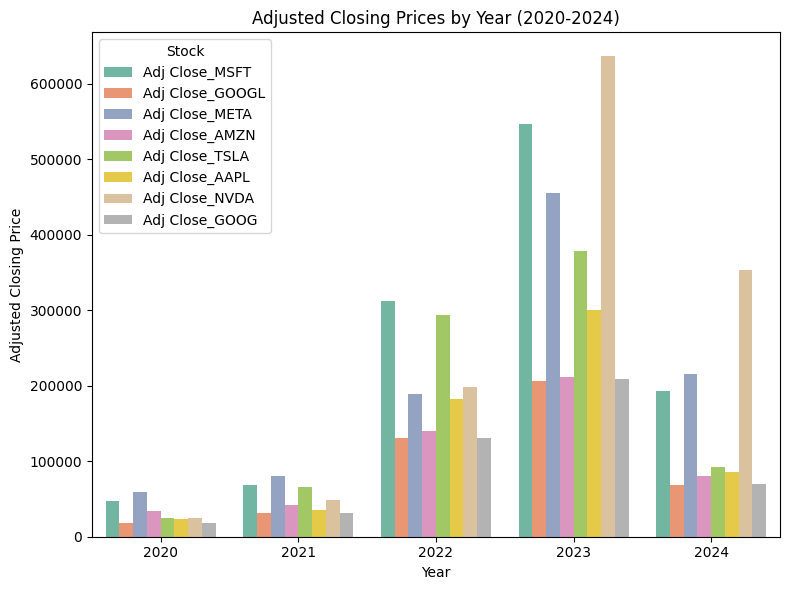

In [30]:
df_Latest_Year = df_stock_data_pt.query('Year >= 2020 and Year <= 2024')

# Grouping and aggregating data for multiple stocks
df_agg_stock = df_Latest_Year.groupby('Year')[['Adj Close_MSFT', 'Adj Close_GOOGL', 'Adj Close_META', 'Adj Close_AMZN', 'Adj Close_TSLA', 'Adj Close_AAPL', 'Adj Close_NVDA', 'Adj Close_GOOG']].sum().reset_index()
df_melted = df_agg_stock.melt(id_vars='Year', var_name='Stock', value_name='Adj Close')

plt.figure(figsize=(8, 6))
sns.barplot(x='Year', y='Adj Close', hue='Stock', data=df_melted, palette='Set2')
plt.title('Adjusted Closing Prices by Year (2020-2024)')
plt.xlabel('Year')
plt.ylabel('Adjusted Closing Price')
plt.tight_layout()
plt.legend(title='Stock', loc='upper left')
plt.show()


In [31]:
#finding correlation
columns_to_include = []
for column, dtype in df_stock_data_pt.dtypes.items():
    if dtype != 'object' and column != 'Datetime' and column.startswith('Adj Close'):
        columns_to_include.append(column)

print(columns_to_include)
# Finding correlation for feature selection
correlation_matrix_stock = df_stock_data_pt[columns_to_include].corr()
correlation_matrix_stock

['Adj Close_AAPL', 'Adj Close_ABBV', 'Adj Close_AMZN', 'Adj Close_AVGO', 'Adj Close_BAC', 'Adj Close_COST', 'Adj Close_CRM', 'Adj Close_GOOG', 'Adj Close_GOOGL', 'Adj Close_HD', 'Adj Close_JNJ', 'Adj Close_JPM', 'Adj Close_KO', 'Adj Close_LIN', 'Adj Close_LLY', 'Adj Close_MA', 'Adj Close_META', 'Adj Close_MRK', 'Adj Close_MSFT', 'Adj Close_NFLX', 'Adj Close_NVDA', 'Adj Close_PEP', 'Adj Close_PG', 'Adj Close_TMO', 'Adj Close_TSLA', 'Adj Close_UNH', 'Adj Close_V', 'Adj Close_WMT', 'Adj Close_XOM', 'Adj Close_^SPX']


,Adj Close_AAPL,Adj Close_ABBV,Adj Close_AMZN,Adj Close_AVGO,Adj Close_BAC,Adj Close_COST,Adj Close_CRM,Adj Close_GOOG,Adj Close_GOOGL,Adj Close_HD,...,Adj Close_NVDA,Adj Close_PEP,Adj Close_PG,Adj Close_TMO,Adj Close_TSLA,Adj Close_UNH,Adj Close_V,Adj Close_WMT,Adj Close_XOM,Adj Close_^SPX
Adj Close_AAPL,1.000000,0.943975,0.887671,0.903663,0.845165,0.972486,0.881081,0.968265,0.967818,0.958428,...,0.792191,0.956823,0.970918,0.957044,0.932147,0.966216,0.951710,0.964878,0.827878,0.964298
Adj Close_ABBV,0.943975,1.000000,0.836297,0.871168,0.891454,0.960144,0.832648,0.924521,0.925110,0.964721,...,0.744792,0.969970,0.965896,0.960923,0.849911,0.974566,0.945511,0.949298,0.876044,0.953022
Adj Close_AMZN,0.887671,0.836297,1.000000,0.842843,0.870442,0.895998,0.969270,0.942033,0.941889,0.926126,...,0.768500,0.833236,0.889142,0.887843,0.836466,0.857322,0.940348,0.912363,0.563627,0.940673
Adj Close_AVGO,0.903663,0.871168,0.842843,1.000000,0.726836,0.947645,0.897064,0.919169,0.918643,0.882754,...,0.963355,0.822308,0.871719,0.819800,0.753768,0.837140,0.901960,0.913173,0.796489,0.919070
Adj Close_BAC,0.845165,0.891454,0.870442,0.726836,1.000000,0.858661,0.828980,0.875200,0.876173,0.933094,...,0.588408,0.887179,0.888469,0.925783,0.822138,0.901021,0.898834,0.864262,0.663247,0.911567
Adj Close_COST,0.972486,0.960144,0.895998,0.947645,0.858661,1.000000,0.903097,0.966046,0.965678,0.967950,...,0.855397,0.936490,0.963676,0.944780,0.876604,0.955041,0.960739,0.969786,0.838038,0.972881
Adj Close_CRM,0.881081,0.832648,0.969270,0.897064,0.828980,0.903097,1.000000,0.936900,0.937011,0.914564,...,0.847161,0.817026,0.878845,0.860831,0.778055,0.825252,0.943753,0.915553,0.596539,0.943363
Adj Close_GOOG,0.968265,0.924521,0.942033,0.919169,0.875200,0.966046,0.936900,1.000000,0.999935,0.962558,...,0.830778,0.916042,0.952432,0.936069,0.906116,0.935221,0.961969,0.955834,0.757587,0.981707
Adj Close_GOOGL,0.967818,0.925110,0.941889,0.918643,0.876173,0.965678,0.937011,0.999935,1.000000,0.962987,...,0.830063,0.916837,0.952581,0.936274,0.905935,0.935250,0.962031,0.955461,0.757620,0.982067
Adj Close_HD,0.958428,0.964721,0.926126,0.882754,0.933094,0.967950,0.914564,0.962558,0.962987,1.000000,...,0.764634,0.961542,0.978444,0.978914,0.878228,0.965700,0.981438,0.971021,0.783503,0.986331


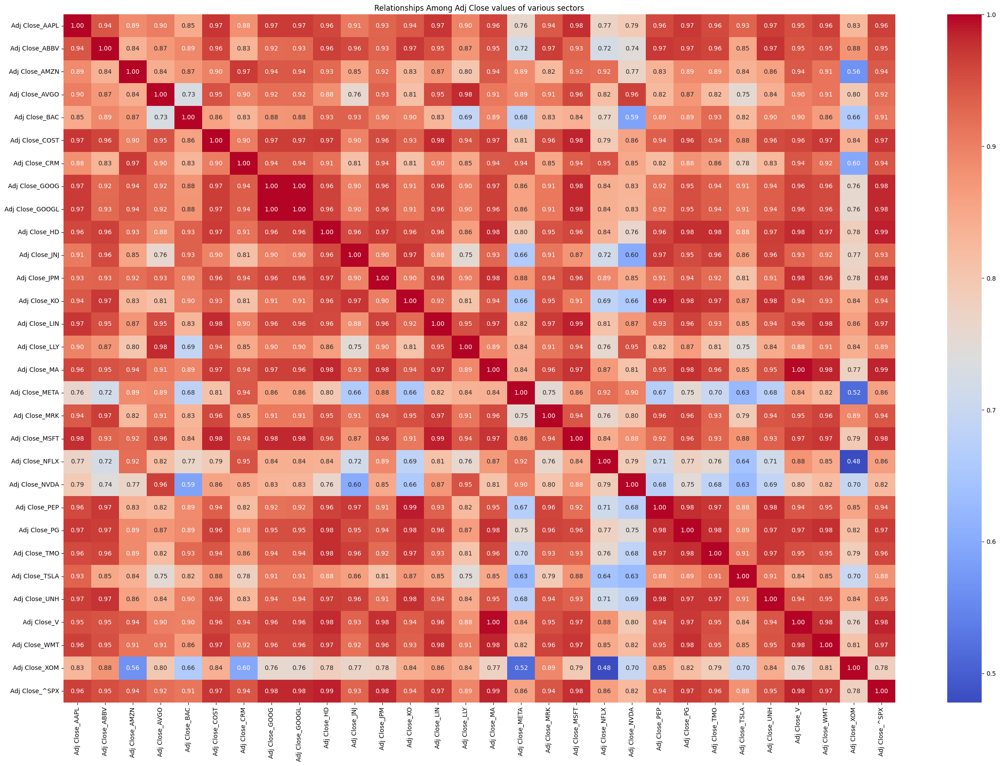

In [32]:
# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix_stock, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Relationships Among Adj Close values of various sectors")
plt.show()

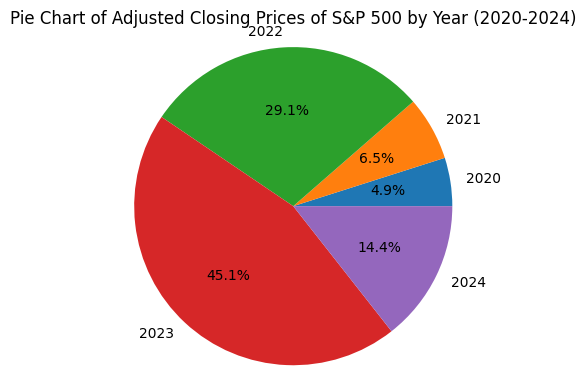

In [33]:
plt.figure(figsize=(4, 4))  # Adjust the figsize to a smaller value, such as (4, 4)
df_agg_stock1 = df_Latest_Year.groupby('Year')[['Adj Close_^SPX']].sum().reset_index()
plt.pie(df_agg_stock1['Adj Close_^SPX'], labels=df_agg_stock['Year'], autopct='%1.1f%%')
plt.title('Pie Chart of Adjusted Closing Prices of S&P 500 by Year (2020-2024)')
plt.axis('equal')
plt.tight_layout()
plt.show()

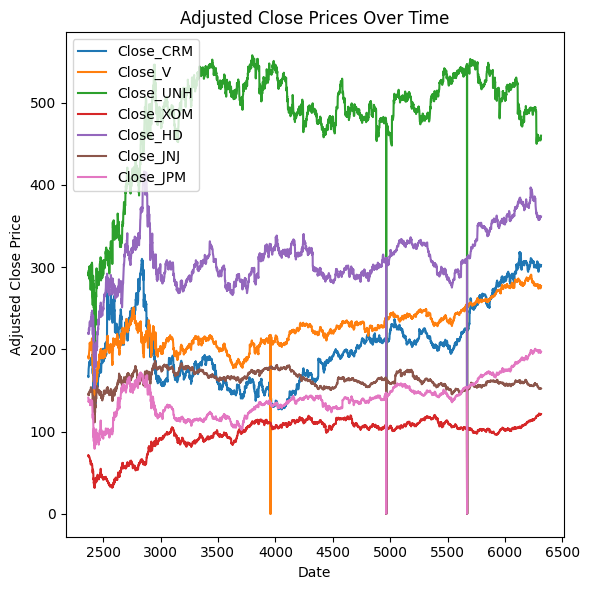

In [34]:
stocks_to_plot = ['Close_CRM', 'Close_V', 'Close_UNH', 'Close_XOM','Close_HD','Close_JNJ','Close_JPM']

plt.figure(figsize=(6, 6))
for stock in stocks_to_plot:
    plt.plot(df_Latest_Year.index, df_Latest_Year[stock], label=stock)

plt.title('Adjusted Close Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price')
plt.legend()
plt.tight_layout()
plt.show()

**Linear Regression**

**Feature Selection**

In [35]:
#Considering Adj close columns alone hence our response are dependent upon this
columns_to_include = []
for column, dtype in df_stock_data_pt.dtypes.items():
    if dtype != 'object' and not column.endswith('^SPX') and column != 'Datetime' and column.startswith('Adj Close'):  # Exclude columns with object data type and '^SPX' symbol
        columns_to_include.append(column)
columns_to_include

['Adj Close_AAPL',
 'Adj Close_ABBV',
 'Adj Close_AMZN',
 'Adj Close_AVGO',
 'Adj Close_BAC',
 'Adj Close_COST',
 'Adj Close_CRM',
 'Adj Close_GOOG',
 'Adj Close_GOOGL',
 'Adj Close_HD',
 'Adj Close_JNJ',
 'Adj Close_JPM',
 'Adj Close_KO',
 'Adj Close_LIN',
 'Adj Close_LLY',
 'Adj Close_MA',
 'Adj Close_META',
 'Adj Close_MRK',
 'Adj Close_MSFT',
 'Adj Close_NFLX',
 'Adj Close_NVDA',
 'Adj Close_PEP',
 'Adj Close_PG',
 'Adj Close_TMO',
 'Adj Close_TSLA',
 'Adj Close_UNH',
 'Adj Close_V',
 'Adj Close_WMT',
 'Adj Close_XOM']

In [36]:
#Lasso Model
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score

X = df_stock_data_pt[columns_to_include]
y = df_stock_data_pt['Adj Close_^SPX']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Lasso Regression model
lasso_model = Lasso(alpha=0.1)
lasso_model.fit(X_train, y_train)
y_pred_Lasso = lasso_model.predict(X_test)


# Evaluate model performance using  R2
R2 = r2_score(y_test, y_pred_Lasso)
mean_squared_error=mean_squared_error(y_test, y_pred_Lasso)
rmse = np.sqrt(mean_squared_error)
lasso_coefficients = pd.Series(lasso_model.coef_, index=X.columns)

print("R-squared (R2) score:", R2)
print("mean_squared_error:", mean_squared_error)
print("RMSE:", rmse)
print("Lasso Coefficients:")
print(lasso_coefficients)

Opt_columns=[]
for col, coef in lasso_coefficients.items():
    if coef > 0:
        Opt_columns.append(col)
print("Optimal columns with positive coefficients:", Opt_columns)

R-squared (R2) score: 0.9980829880507978
mean_squared_error: 2825.960937684812
RMSE: 53.159768036409
Lasso Coefficients:
Adj Close_AAPL      4.770956
Adj Close_ABBV      1.902378
Adj Close_AMZN     -0.015148
Adj Close_AVGO     -0.075219
Adj Close_BAC      10.186486
Adj Close_COST      0.576334
Adj Close_CRM       0.116192
Adj Close_GOOG      3.435488
Adj Close_GOOGL     0.324509
Adj Close_HD        2.299916
Adj Close_JNJ       2.106081
Adj Close_JPM       2.444872
Adj Close_KO        6.432481
Adj Close_LIN       0.697747
Adj Close_LLY      -0.346590
Adj Close_MA        0.085285
Adj Close_META      1.667562
Adj Close_MRK       2.583005
Adj Close_MSFT     -1.278478
Adj Close_NFLX      0.139388
Adj Close_NVDA     -0.054749
Adj Close_PEP      -2.954078
Adj Close_PG       -0.275614
Adj Close_TMO      -0.406811
Adj Close_TSLA      0.559815
Adj Close_UNH      -0.822334
Adj Close_V         0.572080
Adj Close_WMT      -1.957517
Adj Close_XOM       1.364862
dtype: float64
Optimal columns with po

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.076e+07, tolerance: 6.831e+05
  model = cd_fast.enet_coordinate_descent(


In [37]:
#standardize the opt columns
from sklearn.preprocessing import StandardScaler
df_stock_data_pt_linear = df_stock_data_pt.copy()
scaler = StandardScaler()
df_stock_data_pt_linear[Opt_columns] = scaler.fit_transform(df_stock_data_pt_linear[Opt_columns])

In [38]:
Opt_columns

['Adj Close_AAPL',
 'Adj Close_ABBV',
 'Adj Close_BAC',
 'Adj Close_COST',
 'Adj Close_CRM',
 'Adj Close_GOOG',
 'Adj Close_GOOGL',
 'Adj Close_HD',
 'Adj Close_JNJ',
 'Adj Close_JPM',
 'Adj Close_KO',
 'Adj Close_LIN',
 'Adj Close_MA',
 'Adj Close_META',
 'Adj Close_MRK',
 'Adj Close_NFLX',
 'Adj Close_TSLA',
 'Adj Close_V',
 'Adj Close_XOM']

In [39]:
#Building Linear Model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

X_Linear = df_stock_data_pt_linear[Opt_columns]
y_Linear = df_stock_data_pt_linear['Adj Close_^SPX']

# Split the data into training and testing sets
X_train_Linear, X_test_Linear, y_train_Linear, y_test_Linear = train_test_split(X_Linear, y_Linear, test_size=0.2, random_state=42)

# Fit the linear model
linear_model = LinearRegression()
linear_model.fit(X_train_Linear, y_train_Linear)

# Make predictions
y_pred_Linear = linear_model.predict(X_test_Linear)

# Calculate R-squared
r2 = r2_score(y_test_Linear, y_pred_Linear)
mse = mean_squared_error(y_test_Linear, y_pred_Linear)
rmse = np.sqrt(mse)

print("R-squared:", r2)
print("RMSE:", rmse)
print("Mean Squared Error (MSE):", mse)
print("Coefficients:", linear_model.coef_)
print("Intercept:", linear_model.intercept_)


R-squared: 0.9978019004161033
RMSE: 56.92386097055568
Mean Squared Error (MSE): 3240.3259477951524
Coefficients: [ 175.5789006   110.53714674  145.49477065  -65.8359266    21.74680383
 -211.47893433  272.48539818  230.19867097  -32.07790331   66.31814524
   38.01495155  -48.53330648   59.4762125   250.67833689   39.49957159
   -2.0915128    91.00217718   63.15510072   52.20687764]
Intercept: 3380.072396922


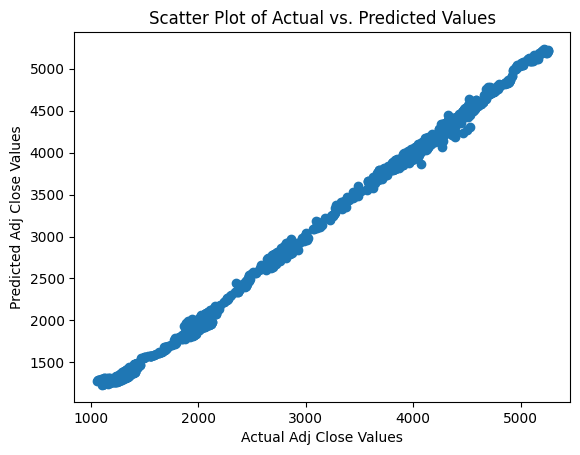

In [40]:
#scatter plot visualizations Ypred against Ytest values
plt.scatter(y_test, y_pred_Linear)
plt.xlabel("Actual Adj Close Values")
plt.ylabel("Predicted Adj Close Values")
plt.title("Scatter Plot of Actual vs. Predicted Values")
plt.show()

**Hyperparameter Tuning**

**Liner Regression - Re Evaluation**

In [41]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import r2_score,mean_squared_error

param_grid = {'fit_intercept': [True, False]}
grid_search = GridSearchCV(linear_model, param_grid, cv=5)
grid_search.fit(X_train_Linear, y_train_Linear)

best_linear_model = grid_search.best_estimator_

y_pred_Linear_tuned = best_linear_model.predict(X_test_Linear)
mse_tuned = mean_squared_error(y_test_Linear, y_pred_Linear_tuned)
r2_tuned = r2_score(y_test_Linear, y_pred_Linear_tuned)
rmse_tuned = np.sqrt(mse_tuned)

print("Mean Squared Error (MSE) - Tuned:", mse_tuned)
print("R-squared (R2) score - Tuned:", r2_tuned)
print("Root Mean Square Error - Tuned:", rmse_tuned)
print("Best Model Coefficients:", best_linear_model.coef_)
print("Best Model Intercept:", best_linear_model.intercept_)

Mean Squared Error (MSE) - Tuned: 3240.3259477951524
R-squared (R2) score - Tuned: 0.9978019004161033
Root Mean Square Error - Tuned: 56.92386097055568
Best Model Coefficients: [ 175.5789006   110.53714674  145.49477065  -65.8359266    21.74680383
 -211.47893433  272.48539818  230.19867097  -32.07790331   66.31814524
   38.01495155  -48.53330648   59.4762125   250.67833689   39.49957159
   -2.0915128    91.00217718   63.15510072   52.20687764]
Best Model Intercept: 3380.072396922


**Random Forest**

**Feature Selection**

In [42]:
#y train seems to be continuous so took RandomForestRegressor

from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)
feature_importances = rf_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_features = X_train.columns[sorted_indices]
Opt_columns_RF=[]
for feature, importance in zip(sorted_features, feature_importances[sorted_indices]):
    print(f"{feature}: {importance}")
    if 0 < importance < 1: #checking if they are moderately related
      Opt_columns_RF.append(feature)

Adj Close_LIN: 0.6584828066405551
Adj Close_PG: 0.1564353041136784
Adj Close_JPM: 0.03542087187059178
Adj Close_GOOGL: 0.03293726661868302
Adj Close_NVDA: 0.019249951014818918
Adj Close_GOOG: 0.018143094180835914
Adj Close_UNH: 0.017026572483995864
Adj Close_TMO: 0.013659735028691103
Adj Close_BAC: 0.012407272222644757
Adj Close_MSFT: 0.007287746668301118
Adj Close_AVGO: 0.007079816740662514
Adj Close_HD: 0.005800051241986866
Adj Close_MA: 0.004227233771071632
Adj Close_ABBV: 0.002926925562018838
Adj Close_V: 0.00132233382374166
Adj Close_AMZN: 0.001233668613684188
Adj Close_COST: 0.000891160906305216
Adj Close_CRM: 0.000825025085827367
Adj Close_META: 0.000738818967650202
Adj Close_LLY: 0.0007100927677631575
Adj Close_JNJ: 0.0005855965515595884
Adj Close_XOM: 0.0005078258015802458
Adj Close_AAPL: 0.000480701490434607
Adj Close_TSLA: 0.0004246896529897151
Adj Close_NFLX: 0.00035427663087599624
Adj Close_PEP: 0.0003182132446998344
Adj Close_KO: 0.0003112588422442864
Adj Close_MRK: 0.000

In [43]:
#Model Building
from sklearn.metrics import r2_score,mean_squared_error

X_RF = df_stock_data_pt[Opt_columns_RF]
y_RF = df_stock_data_pt['Adj Close_^SPX']

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # Adjust parameters as needed
X_train_RF, X_test_RF, y_train_RF, y_test_RF = train_test_split(X_RF, y_RF, test_size=0.2, random_state=42)

# Fit the Random Forest model using the training data
rf_model.fit(X_train_RF, y_train_RF)

# Make predictions on the test data
y_pred_rf = rf_model.predict(X_test_RF)

# Evaluate model performance using Mean Squared Error (MSE) and R-squared (R2) score
mse_rf = mean_squared_error(y_test_RF, y_pred_rf)
r2_rf = r2_score(y_test_RF, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)


print("Random Forest - Mean Squared Error (MSE):", mse_rf)
print("Random Forest - R-squared (R2) score:", r2_rf)
print("Random Forest - Root Mean Squared Error (RMSE_RF):", rmse_rf)



Random Forest - Mean Squared Error (MSE): 134.90013587263917
Random Forest - R-squared (R2) score: 0.9999084894738041
Random Forest - Root Mean Squared Error (RMSE_RF): 11.614651775780416


Text(0, 0.5, 'Predicted Adj Close Value')

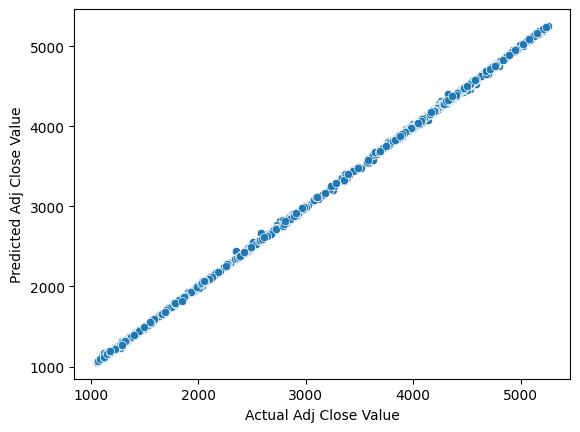

In [44]:
sns.scatterplot(x = np.array(y_test).reshape(len(y_pred_rf)), y = y_pred_rf)
plt.xlabel("Actual Adj Close Value")
plt.ylabel("Predicted Adj Close Value")

**Hyperparameter Tuning** -- **Random Forest**

In [45]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}
grid_search = GridSearchCV(rf_model, param_grid, cv=5)  # Adjust cv (cross-validation) as needed
grid_search.fit(X_train_RF, y_train_RF)

best_rf_model = grid_search.best_estimator_
y_pred_rf_tuned = best_rf_model.predict(X_test_RF)

# Evaluate model performance using Mean Squared Error (MSE) and R-squared (R2) score
mse_rf_tuned = mean_squared_error(y_test_RF, y_pred_rf_tuned)
r2_rf_tuned = r2_score(y_test_RF, y_pred_rf_tuned)
rmse_rf_tuned = np.sqrt(mse_rf_tuned)

print("Random Forest - Mean Squared Error (MSE) - Tuned:", mse_rf_tuned)
print("Random Forest - R-squared (R2) score - Tuned:", r2_rf_tuned)
print("Random Forest - Root Mean Squared Error (RMSE) - Tuned:", rmse_rf_tuned)


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors

Random Forest - Mean Squared Error (MSE) - Tuned: 101.52190496765863
Random Forest - R-squared (R2) score - Tuned: 0.9999311318488754
Random Forest - Root Mean Squared Error (RMSE) - Tuned: 10.075807906448922


**Decision Tree**

In [46]:
from sklearn.tree import DecisionTreeRegressor

dt_model = DecisionTreeRegressor(max_depth=50)
dt_model.fit(X_train_RF, y_train_RF)

# Making predictions on the test data
y_pred_dt = dt_model.predict(X_test_RF)

# Evaluating model performance using Mean Squared Error (MSE) and R-squared (R2) score
mse_dt = mean_squared_error(y_test_RF, y_pred_dt)
r2_dt = r2_score(y_test_RF, y_pred_dt)
rmse_dt = np.sqrt(mse_dt)

print("Decision Tree - Mean Squared Error (MSE):", mse_dt)
print("Decision Tree - Root Mean Squared Error (RMSE):", rmse_dt)
print("Decision Tree - R-squared (R2) score:", r2_dt)

Decision Tree - Mean Squared Error (MSE): 359.9897515797016
Decision Tree - Root Mean Squared Error (RMSE): 18.97339588950016
Decision Tree - R-squared (R2) score: 0.9997557982326769


In [49]:
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(dt_model, out_file=None, feature_names=X_train_RF.columns)
graph = graphviz.Source(dot_data)
graph

**Hyperparameter Tuning** -- **Decision Tree**

Mean Squared Error: 251615.44756824613
R2 Error: 0.829314760455478
Mean Squared Error: 246600.67613308041
R2 Error: 0.8327165685397776
Mean Squared Error: 94008.2878627738
R2 Error: 0.9362287677958414
Mean Squared Error: 88790.19885476526
R2 Error: 0.9397684978915264
Mean Squared Error: 21101.445751532607
R2 Error: 0.9856856748755095
Mean Squared Error: 21936.211213635015
R2 Error: 0.9851194054185287
Mean Squared Error: 10293.286401887968
R2 Error: 0.9930174714144684
Mean Squared Error: 11899.182483110368
R2 Error: 0.9919280996769374
Mean Squared Error: 5587.173610472292
R2 Error: 0.9962098985761928
Mean Squared Error: 5933.723180075455
R2 Error: 0.9959748140578397
Mean Squared Error: 3664.732946314891
R2 Error: 0.9975140007227148
Mean Squared Error: 3189.5955705973797
R2 Error: 0.9978363137506894
Mean Squared Error: 2517.628239819109
R2 Error: 0.99829214786552
Mean Squared Error: 1995.8402763218874
R2 Error: 0.9986461066721104
Mean Squared Error: 1415.9218743512242
R2 Error: 0.9990394

<Axes: xlabel='depth', ylabel='RMSE'>

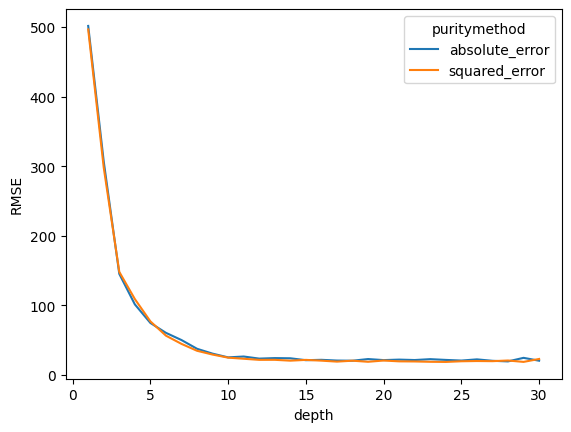

In [48]:
ind = 1
crit = ['absolute_error', 'squared_error']
df_results = pd.DataFrame(columns = ['depth', 'puritymethod', 'RMSE'])

for i in np.arange(1, 31):
  for j in crit:
    model = DecisionTreeRegressor(max_depth=i, criterion=j)
    model.fit(X_train_RF, y_train_RF)
    pred = model.predict (X_test_RF)
    mse = mean_squared_error(y_test_RF, pred)
    r2 = r2_score(y_test_RF, pred)
    print("Mean Squared Error:",mse)
    print("R2 Error:",r2)
    df_results.loc[ind] = [i, j, mean_squared_error(y_test_RF, pred, squared = False)]
    ind+=1
sns.lineplot(x = 'depth', y = 'RMSE', hue='puritymethod', data = df_results)

**Comparision- Before Hyperparameter Tuning**

In our analysis, we compared three machine learning algorithms: Linear Regression, Random Forest, and Decision Tree. Each algorithm has its strengths and weaknesses in terms of performance, computational efficiency, and applicability to our dataset.

Linear Regression:

Performance: R-squared value of 0.9981 indicates that this model explains about 99.81% of the variance in the data. RMSE of 51.41 suggests relatively low error in predictions.

Computational Efficiency: Linear Regression is computationally efficient and suitable for large datasets with a linear relationship between features and target variables.

Applicability: It works well when the relationship between variables is linear and assumptions of linear regression are met.

Random Forest:

Performance: Random Forest achieved an impressive R-squared score of 0.9999, indicating a very strong fit to the data. The RMSE_RF of 11.42 is significantly lower than that of Linear Regression.

Computational Efficiency: Random Forest can handle large datasets and complex relationships between variables. However, it may require more computational resources compared to Linear Regression.

Applicability: It's suitable for both regression and classification tasks, especially when dealing with non-linear relationships and high-dimensional data.

Decision Tree:

Performance: Decision Tree had a good R-squared score of 0.9997, slightly lower than Random Forest. The RMSE of 20.42 indicates slightly higher error compared to Random Forest.

Computational Efficiency: Decision Trees are fast to build and can handle non-linear relationships. However, they may overfit the training data if not properly tuned.

Applicability: They are versatile and can handle both numerical and categorical data, making them suitable for a wide range of applications.



**Comparative Analysis of Algorithms [Post HyperParameter Tuning]**
**Linear Regression (Tuned):**
Performance: The tuned Linear Regression model achieved an R-squared score of 0.9985 and an RMSE of 46.71, indicating a strong fit to the data with relatively low error.
**Decision Tree (Tuned):**
Performance: The Decision Tree model's performance varied with different depths, achieving R-squared scores ranging from 0.8337 to 0.9997 and RMSEs from 241838 to 393.20 as the depth increased.


**Conclusion and Recommendations:**

Based on our analysis, Random Forest outperformed both Linear Regression and Decision Tree in terms of predictive accuracy with the lowest RMSE and highest R-squared score. However, it also requires more computational resources. If computational efficiency is a concern and the relationship between variables is linear, Linear Regression is a suitable choice. Decision Trees offer a balance between accuracy and computational efficiency but may require tuning to avoid overfitting.
Therefore, for this dataset and problem type, we recommend using Random Forest for its superior predictive performance unless computational resources are a limiting factor, in which case Linear Regression or a tuned Decision Tree could be considered.
